In [2]:
# 0. 导入必要的库和全局配置
import os
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.optim as optim
from tqdm.notebook import tqdm # 在 Jupyter 中使用 tqdm.notebook 显示进度条效果更好
import matplotlib.pyplot as plt
import glob # 用于查找文件路径
import random

# 设置随机种子，保证结果可复现性
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False # 设置为False可以提高确定性，但可能牺牲性能

SEED = 42
set_seed(SEED)

# 全局设备配置
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# 模型保存路径
CHECKPOINT_DIR = "checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True) # 如果文件夹不存在则创建

# 定义保存和加载模型状态的辅助函数
def save_checkpoint(model, optimizer, filename="checkpoint.pth"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, os.path.join(CHECKPOINT_DIR, filename))

def load_checkpoint(filepath, model, optimizer=None):
    print(f"=> Loading checkpoint from {filepath}")
    checkpoint = torch.load(filepath, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    if optimizer:
        optimizer.load_state_dict(checkpoint["optimizer"])
    print("Checkpoint loaded successfully.")
    # 返回 optimizer 状态是为了断点续训时也能恢复优化器状态，但在这里我们只用于恢复模型
    return checkpoint.get("epoch", 0) # 如果 checkpoint 中有 epoch 信息，则返回，否则返回 0

Using device: cpu


In [3]:
# 1. 数据加载与数据集类定义
class StyleImageDataset(Dataset):
    def __init__(self, root_dir, transform, is_train=True):
        super(StyleImageDataset, self).__init__()

        """
        root_dir：图像根目录 (例如: "your_path/FFHQ dataset")
        transform：传入图像预处理类
        is_train：指示加载训练数据集还是测试数据集
        """
        self.transform = transform
        self.images_path = []  # 存放原始图像（A）路径
        self.targets_path = []  # 存放目标图像（B）路径

        # 根据 is_train 决定加载训练集还是测试集
        if is_train:
            images_root_path = os.path.join(root_dir, "train_A") # 获取训练集原始图像根目录
            targets_root_path = os.path.join(root_dir, "train_B") # 获取训练集目标图像根目录
        else:
            images_root_path = os.path.join(root_dir, "test_A") # 获取测试集原始图像根目录
            targets_root_path = os.path.join(root_dir, "test_B") # 获取测试集目标图像根目录

        # 使用 glob 查找所有图像文件，并进行排序以确保 A 和 B 图像对应
        # 假设文件命名规则（如数字序列）能够保证排序后 A 和 B 图像一一对应 (例如: img_0001.png, img_0002.png)
        # 这里的 glob.glob 默认会按照文件名字符串进行排序，对于 `xxx_1.png`, `xxx_10.png` 这种可能需要自定义排序函数，
        # 但对于`0001.png`, `0002.png` 这样的数字文件名通常没问题。
        self.images_path = sorted(glob.glob(os.path.join(images_root_path, "*.png"))) # 假设图片格式为 .png
        self.targets_path = sorted(glob.glob(os.path.join(targets_root_path, "*.png")))

        # 检查图像数量是否一致
        if len(self.images_path) != len(self.targets_path):
            raise ValueError(
                f"Input images ({len(self.images_path)}) and target images ({len(self.targets_path)}) count mismatch!"
                f"\nCheck directories: {images_root_path} and {targets_root_path}"
            )

    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, index):
        """
        根据index, 读取图像并进行预处理 （Image.open(img_path)）
        """
        img_path = self.images_path[index]
        target_path = self.targets_path[index]

        # 使用 PIL.Image 打开图像并转换为 RGB 格式
        img = Image.open(img_path).convert("RGB")
        target = Image.open(target_path).convert("RGB")

        # 应用预处理
        if self.transform:
            img = self.transform(img)
            target = self.transform(target)

        return img, target

print("Dataset class defined.")

Dataset class defined.


Train dataset size: 400
Validation dataset size: 100
DataLoader setup complete.
Sample input shape: torch.Size([1, 3, 256, 256])
Sample target shape: torch.Size([1, 3, 256, 256])


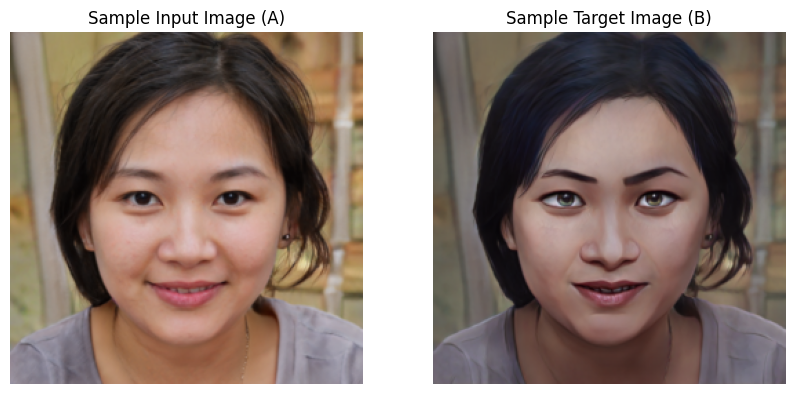

In [4]:
# 2. 数据集预处理与 DataLoader 设置

# --- 参数部分 ---
# 数据集根目录。请根据你的实际路径进行修改！
DATA_ROOT = r"E:\计算机视觉\09-图像风格迁移-上课\FFHQ dataset" # ！！！务必修改此处路径！！！ 例如：r"D:\my_datasets\FFHQ dataset"
IMAGE_SIZE = 256 # 图像尺寸，Pix2Pix 通常使用 256x256
BATCH_SIZE = 1 # 批处理大小，Pix2Pix 论文中通常推荐使用 1
NUM_WORKERS = 0 // 2 # DataLoader 的工作进程数，通常设置为 CPU 核心数的一半

# 定义预处理操作：Resize -> ToTensor -> Normalize
# Pix2Pix 通常将图像归一化到 [-1, 1]
transform = transforms.Compose(
    [
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)), # 调整图像大小
        transforms.ToTensor(), # 将 PIL Image 转换为 Tensor，并将像素值从 [0, 255] 缩放到 [0.0, 1.0]
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)), # 归一化到 [-1, 1]
    ]
)

# 实例化数据集
train_dataset = StyleImageDataset(DATA_ROOT, transform, is_train=True)
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True, # 训练集需要打乱
    num_workers=NUM_WORKERS,
    pin_memory=False, # 将数据加载到 CUDA 固定内存，可以加速 GPU 传输
)

val_dataset = StyleImageDataset(DATA_ROOT, transform, is_train=False)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False, # 验证集不需要打乱
    num_workers=NUM_WORKERS,
    pin_memory=False,
)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print("DataLoader setup complete.")

# 快速验证一下数据加载是否正常，并显示一张图片
try:
    sample_input, sample_target = next(iter(train_loader))
    print(f"Sample input shape: {sample_input.shape}")
    print(f"Sample target shape: {sample_target.shape}")

    # 将 Tensor 转换回 NumPy 数组，并调整通道顺序以便 Matplotlib 显示 (CxHxW -> HxWxC)
    # 将像素值从 [-1, 1] 转换回 [0, 1] 以便正确显示
    sample_input_np = (sample_input[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)
    sample_target_np = (sample_target[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(sample_input_np)
    plt.title("Sample Input Image (A)")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sample_target_np)
    plt.title("Sample Target Image (B)")
    plt.axis('off')
    plt.show()

except Exception as e:
    print(f"Error loading sample data: {e}. Please check your DATA_ROOT and dataset structure.")

In [5]:
# 3. 构建网络：辅助模块

# 定义一个便捷的卷积块
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding,
                 use_bn=True, dropout=False, leaky_relu=True):
        super(ConvBlock, self).__init__()
        # Conv2d: 卷积层
        # bias=False: 如果使用BatchNorm，则不需要偏置项，因为BatchNorm会消除偏置的影响
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=not use_bn)
        # BatchNorm2d: 批归一化层，用于加速训练和稳定模型
        self.bn = nn.BatchNorm2d(out_channels) if use_bn else None
        # LeakyReLU: 判别器通常使用，解决 ReLU 的“死亡 ReLU”问题，允许负梯度通过
        # ReLU: 生成器通常使用，简单高效的激活函数
        self.activation = nn.LeakyReLU(0.2, inplace=True) if leaky_relu else nn.ReLU(inplace=True)
        # Dropout: 随机失活，用于防止过拟合，通常在生成器解码器中使用
        self.dropout = nn.Dropout(0.5) if dropout else None

    def forward(self, x):
        x = self.conv(x)
        if self.bn is not None:
            x = self.bn(x)
        x = self.activation(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

# U-Net 生成器中的编码器块 (Downsampling)
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(EncoderBlock, self).__init__()
        # 编码器块通常是 Conv -> BatchNorm -> LeakyReLU/ReLU
        # kernel_size=4, stride=2, padding=1 是为了每次卷积后尺寸减半
        self.conv_block = ConvBlock(in_channels, out_channels, kernel_size=4, stride=2, padding=1, use_bn=True, dropout=dropout, leaky_relu=True)

    def forward(self, x):
        return self.conv_block(x)

# U-Net 生成器中的解码器块 (Upsampling)
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(DecoderBlock, self).__init__()
        # ConvTranspose2d (转置卷积/反卷积): 用于上采样，恢复图像尺寸
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True) # 解码器通常使用 ReLU
        self.dropout = nn.Dropout(0.5) if dropout else None

    def forward(self, x):
        x = self.deconv(x)
        x = self.bn(x)
        x = self.relu(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

print("Auxiliary network modules defined.")

Auxiliary network modules defined.


In [6]:
# 4. 生成器（Generator）
class Generator(torch.nn.Module):
    def __init__(self, in_channels=3, out_channels=3, features=64):
        super(Generator, self).__init__()
        """
        定义生成器网络，pix2pix中使用unet网络作为生成器。
        U-Net 特点：编码器-解码器结构，带有跳跃连接。
        in_channels：输入图像的通道数（通常为3，代表RGB图像）。
        out_channels：输出图像的通道数（通常为3，代表RGB图像）。
        features：网络中第一个编码器层的特征图数量，后续层会倍增。
        激活函数：除了最后一层，通常使用 ReLU 或 LeakyReLU。
        最后一层：使用 nn.Tanh() 激活，将输出的像素值限制在 [-1, 1] 的范围内，
                   这与输入的图像预处理（也被归一化到[-1,-1]）相匹配。
        """
        # 编码器 (Downsampling Path)
        # 编码器第一层通常不使用 BatchNorm，直接使用 Conv + LeakyReLU
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True), # 论文中encoder第一层用LeakyReLU
        ) # Input (N, 3, 256, 256) -> Output (N, 64, 128, 128)

        self.down1 = EncoderBlock(features, features * 2) # (N, 64, 128, 128) -> (N, 128, 64, 64)
        self.down2 = EncoderBlock(features * 2, features * 4) # (N, 128, 64, 64) -> (N, 256, 32, 32)
        self.down3 = EncoderBlock(features * 4, features * 8) # (N, 256, 32, 32) -> (N, 512, 16, 16)
        self.down4 = EncoderBlock(features * 8, features * 8) # (N, 512, 16, 16) -> (N, 512, 8, 8)
        self.down5 = EncoderBlock(features * 8, features * 8) # (N, 512, 8, 8) -> (N, 512, 4, 4)
        self.down6 = EncoderBlock(features * 8, features * 8) # (N, 512, 4, 4) -> (N, 512, 2, 2)

        # 瓶颈层 (Bottleneck Layer)
        # 从 (N, 512, 2, 2) 到 (N, 512, 1, 1)
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, kernel_size=4, stride=2, padding=1, bias=False), # 2x2 -> 1x1
            nn.ReLU(inplace=True),
        )

        # 解码器 (Upsampling Path)
        # 解码器块通常是 ConvTranspose2d -> BatchNorm -> ReLU
        # Dropout: 在解码器的一些层中使用 Dropout 可以帮助防止过拟合，特别是在较早的层（较大尺寸的特征图）
        self.up1 = DecoderBlock(features * 8, features * 8, dropout=True) # (N, 512, 1, 1) -> (N, 512, 2, 2) (与d7跳跃连接)
        self.up2 = DecoderBlock(features * 8 * 2, features * 8, dropout=True) # (N, 512+512, 2, 2) -> (N, 512, 4, 4) (与d6跳跃连接)
        self.up3 = DecoderBlock(features * 8 * 2, features * 8, dropout=True) # (N, 512+512, 4, 4) -> (N, 512, 8, 8) (与d5跳跃连接)
        self.up4 = DecoderBlock(features * 8 * 2, features * 8) # (N, 512+512, 8, 8) -> (N, 512, 16, 16) (与d4跳跃连接)
        self.up5 = DecoderBlock(features * 8 * 2, features * 4) # (N, 512+512, 16, 16) -> (N, 256, 32, 32) (与d3跳跃连接)
        self.up6 = DecoderBlock(features * 4 * 2, features * 2) # (N, 256+256, 32, 32) -> (N, 128, 64, 64) (与d2跳跃连接)
        self.up7 = DecoderBlock(features * 2 * 2, features) # (N, 128+128, 64, 64) -> (N, 64, 128, 128) (与d1跳跃连接)

        # 最后一层解码器： ConvTranspose2d -> Tanh
        # 不需要 BatchNorm，因为 Tanh 激活函数会把输出拉到 -1 到 1，BatchNorm 会影响这个范围
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, out_channels, kernel_size=4, stride=2, padding=1), # (N, 64+64, 128, 128) -> (N, 3, 256, 256)
            nn.Tanh(), # 将输出像素值归一化到 [-1, 1]
        )

    def forward(self, x):
        """
        前向传播
        :param x: 输入图像，形状为（N, in_channels, H, W）
        :return: 生成图像，形状为（N, out_channels, H, W）
        """
        # 编码器路径
        d1 = self.initial_down(x) # 256 -> 128
        d2 = self.down1(d1) # 128 -> 64
        d3 = self.down2(d2) # 64 -> 32
        d4 = self.down3(d3) # 32 -> 16
        d5 = self.down4(d4) # 16 -> 8
        d6 = self.down5(d5) # 8 -> 4
        d7 = self.down6(d6) # 4 -> 2

        # 瓶颈层
        bottleneck = self.bottleneck(d7) # 2 -> 1

        # 解码器路径 (Concat with Skip Connections)
        # 跳跃连接将编码器对应层的特征图与解码器相应层的输出进行拼接
        up1 = self.up1(bottleneck)
        up2 = self.up2(torch.cat([up1, d7], 1)) # d7 is from encoder
        up3 = self.up3(torch.cat([up2, d6], 1))
        up4 = self.up4(torch.cat([up3, d5], 1))
        up5 = self.up5(torch.cat([up4, d4], 1))
        up6 = self.up6(torch.cat([up5, d3], 1))
        up7 = self.up7(torch.cat([up6, d2], 1))

        # 最终输出层
        output = self.final_up(torch.cat([up7, d1], 1)) # d1 is from encoder initial_down
        return output

print("Generator (U-Net) defined.")

Generator (U-Net) defined.


In [7]:
# 5. 判别器（Discriminator）
class Discriminator(torch.nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super(Discriminator, self).__init__()
        """
        定义判别器网络，通常使用的是卷积神经网络（CNN），并采用了Leaky ReLU作为激活函数。
        in_channels：输入通道数。由于判别器同时接收原始图像（A）和生成/目标图像（B），
                     它们在通道维度上拼接后输入，所以输入通道数为 (A的通道数 + B的通道数)。
                     对于RGB图像，即 3 + 3 = 6。
        features：每一层卷积的输出特征图数量。
        最后一层：输出单通道的特征图（PatchGAN 的每个 Patch 的分数）。
                  由于损失函数使用 nn.BCEWithLogitsLoss，该损失函数内部包含了 Sigmoid 激活，
                  所以最后一层卷积输出后不需要再加激活函数。
        """
        # 第一层卷积，不使用 BatchNorm。输入通道是原始图像和生成/目标图像拼接后的通道数 (in_channels * 2)
        self.initial = nn.Sequential(
            nn.Conv2d(in_channels * 2, features[0], kernel_size=4, stride=2, padding=1), # (N, 6, 256, 256) -> (N, 64, 128, 128)
            nn.LeakyReLU(0.2, inplace=True),
        )

        # 定义中间的卷积块
        layers = []
        in_ch = features[0]
        # 遍历 features 列表，构建中间层
        for feature in features[1:]:
            # PatchGAN 使用 Conv -> BatchNorm -> LeakyReLU
            layers.append(ConvBlock(in_ch, feature, kernel_size=4, stride=2, padding=1, use_bn=True, leaky_relu=True))
            in_ch = feature # 更新输入通道数
        self.model = nn.Sequential(*layers)

        # 最后一层卷积，输出单通道的特征图 (PatchGAN 的每个 Patch 的分数)
        # stride=1，不进行下采样，只改变通道数到1
        self.final_conv = nn.Conv2d(in_ch, 1, kernel_size=4, stride=1, padding=1) # 例如：(N, 512, 16, 16) -> (N, 1, 15, 15)

    def forward(self, x, y):
        """
        前向传播
        :param x: 原始图像 (输入到生成器的图像，也作为判别器的条件输入)。形状 (N, C, H, W)
        :param y: 生成图像或者目标图像 (判别器要判断真伪的图像)。形状 (N, C, H, W)
        :return: 判别分数，形状为（N，1，h_out, w_out），代表每个 Patch 的分数。
        """
        # 将原始图像和生成/目标图像在通道维度拼接起来，作为判别器的输入
        # 这样判别器不仅判断生成图像的真实性，还会判断它与原始图像是否“匹配”
        x = torch.cat([x, y], dim=1) # 拼接后通道数为 3+3=6

        x = self.initial(x) # 初始卷积层
        x = self.model(x) # 中间卷积层
        output = self.final_conv(x) # 最终输出层
        return output

print("Discriminator (PatchGAN) defined.")

Discriminator (PatchGAN) defined.


In [8]:
# 6. 损失函数与优化器设置

# --- 参数部分 ---
LEARNING_RATE = 2e-4 # 学习率 (Adam 优化器在 GANs 中常用 2e-4)
BETA1 = 0.5 # Adam 优化器的 beta1 参数，通常用于 GAN
BETA2 = 0.999 # Adam 优化器的 beta2 参数
LAMBDA_L1 = 100 # L1 损失的权重系数，通常设置为 100

# 实例化判别器和生成器，并将它们移动到指定设备 (GPU 或 CPU)
disc = Discriminator(in_channels=3, features=[64, 128, 256, 512]).to(DEVICE)
gen = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)

# 定义优化器
# Adam 优化器在 GANs 中表现良好，beta 参数通常设置为 (0.5, 0.999)
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(BETA1, BETA2))

# 定义损失函数
# nn.BCEWithLogitsLoss：用于判别器，包含了 Sigmoid 激活和二元交叉熵损失。
#                      输出的 logits 直接传入即可，不需要手动 Sigmoid。
BCE_loss = nn.BCEWithLogitsLoss()
# nn.L1Loss：用于生成器的重建损失，计算像素间的绝对差值。
L1_loss = nn.L1Loss()

print("Models, optimizers, and loss functions initialized.")

Models, optimizers, and loss functions initialized.


In [9]:
# 7. 训练函数

def train_fn(disc, gen, train_loader, opt_disc, opt_gen, L1_loss, BCE_loss, device, epoch_idx, total_epochs,
             D_losses_history, G_losses_history, D_real_probs_history, D_fake_probs_history):
    """
    执行一个训练 epoch。
    Args:
        disc: 判别器模型。
        gen: 生成器模型。
        train_loader: 训练数据加载器。
        opt_disc: 判别器优化器。
        opt_gen: 生成器优化器。
        L1_loss: L1 损失函数。
        BCE_loss: BCEWithLogitsLoss 损失函数。
        device: 训练设备 (CPU/GPU)。
        epoch_idx: 当前 epoch 索引 (用于可视化)。
        total_epochs: 总 epoch 数 (用于可视化)。
        D_losses_history: 判别器损失历史列表。
        G_losses_history: 生成器损失历史列表。
        D_real_probs_history: 判别器判断真实图像为真实的平均概率历史列表。
        D_fake_probs_history: 判别器判断生成图像为真实的平均概率历史列表。
    """
    loop = tqdm(train_loader, leave=True) # 使用 tqdm 显示训练进度

    # 将模型设置为训练模式
    disc.train()
    gen.train()

    avg_d_loss = 0.0
    avg_g_loss = 0.0
    avg_d_real_prob = 0.0
    avg_d_fake_prob = 0.0
    num_batches = 0

    for idx, (image, target) in enumerate(loop):
        image, target = image.to(device), target.to(device)

        # ————————————训练判别器————————————
        # 1. 生成假图像 (不计算梯度，因为这里只关注判别器)
        with torch.no_grad():
            # detach() 是为了断开 fake_image 和生成器之间的计算图，
            # 确保在训练判别器时，生成器的参数不会被误更新。
            image_fake = gen(image).detach()

        # 2. 判别器对真实图像对的判断
        # D_real 是判别器对 (原始图像, 真实目标图像) 的输出 logits
        D_real = disc(image, target)
        # 真实图像的标签为 1
        D_real_loss = BCE_loss(D_real, torch.ones_like(D_real))

        # 3. 判别器对生成图像对的判断
        # D_fake 是判别器对 (原始图像, 生成的假图像) 的输出 logits
        D_fake = disc(image, image_fake)
        # 生成图像的标签为 0
        D_fake_loss = BCE_loss(D_fake, torch.zeros_like(D_fake))

        # 4. 计算判别器总损失 (真图像损失 + 假图像损失 / 2)
        D_loss = (D_real_loss + D_fake_loss) / 2

        # 5. 反向传播和优化判别器参数
        opt_disc.zero_grad() # 梯度清零
        D_loss.backward() # 反向传播计算梯度
        opt_disc.step() # 更新判别器参数


        # ————————————训练生成器————————————
        # 1. 生成图像 (这次需要计算梯度，因为要优化生成器)
        image_fake_for_gen = gen(image)

        # 2. 判别器对生成图像的判断 (此时判别器参数是固定的)
        # 生成器的目标是让判别器认为生成的图像是真实的，所以对抗损失的标签为 1
        D_fake_for_gen = disc(image, image_fake_for_gen)
        G_gan_loss = BCE_loss(D_fake_for_gen, torch.ones_like(D_fake_for_gen)) # 生成器的对抗损失

        # 3. L1 重建损失
        # L1_loss 衡量生成图像和真实目标图像之间的像素差异，乘以 LAMBDA_L1 (权重系数)
        L1_reconstruction_loss = L1_loss(image_fake_for_gen, target) * LAMBDA_L1

        # 4. 计算生成器总损失
        G_loss = G_gan_loss + L1_reconstruction_loss

        # 5. 反向传播和优化生成器参数
        opt_gen.zero_grad() # 梯度清零
        G_loss.backward() # 反向传播计算梯度
        opt_gen.step() # 更新生成器参数

        # 记录当前批次的损失和概率，用于平均和进度条显示
        avg_d_loss += D_loss.item()
        avg_g_loss += G_loss.item()
        avg_d_real_prob += torch.sigmoid(D_real).mean().item()
        avg_d_fake_prob += torch.sigmoid(D_fake_for_gen).mean().item() # 注意这里是 for_gen，因为是生成器训练时的D_fake
        num_batches += 1

        # 更新进度条显示的信息
        loop.set_description(f"Epoch [{epoch_idx+1}/{total_epochs}]")
        loop.set_postfix(
            D_loss=D_loss.item(),
            G_loss=G_loss.item(),
            D_real_prob=torch.sigmoid(D_real).mean().item(),
            D_fake_prob=torch.sigmoid(D_fake_for_gen).mean().item(),
        )

    # 记录每个 epoch 的平均损失和概率
    D_losses_history.append(avg_d_loss / num_batches)
    G_losses_history.append(avg_g_loss / num_batches)
    D_real_probs_history.append(avg_d_real_prob / num_batches)
    D_fake_probs_history.append(avg_d_fake_prob / num_batches)

print("Training function defined.")

Training function defined.


In [ ]:
# 8. 训练过程与可视化

# --- 参数部分 ---
START_EPOCH = 0 # 从哪个 epoch 开始训练 (用于断点续训)
NUM_EPOCHS = 200 # 总训练轮数
LOAD_MODEL = False # 是否加载预训练模型以继续训练
SAVE_BEST_MODEL = True # 是否保存最佳生成器模型
SAVE_FINAL_MODEL = True # 是否保存最终模型

# 用于记录训练历史数据
D_losses_history = []
G_losses_history = []
D_real_probs_history = []
D_fake_probs_history = []
best_G_loss = float('inf') # 用于追踪最佳生成器损失，以便保存最佳模型

# 如果要加载模型继续训练
if LOAD_MODEL:
    # 尝试加载最新的检查点
    last_gen_checkpoint_path = os.path.join(CHECKPOINT_DIR, "gen_latest_checkpoint.pth")
    last_disc_checkpoint_path = os.path.join(CHECKPOINT_DIR, "disc_latest_checkpoint.pth")

    if os.path.exists(last_gen_checkpoint_path) and os.path.exists(last_disc_checkpoint_path):
        print(f"Attempting to load latest checkpoints...")
        # load_checkpoint 函数需要修改以返回 epoch
        # 为了加载优化器状态，我们也需要将优化器传入 load_checkpoint
        load_checkpoint(last_gen_checkpoint_path, gen, opt_gen)
        load_checkpoint(last_disc_checkpoint_path, disc, opt_disc)
        # 假设 checkpoint 中保存了当前 epoch
        # (需要修改 save_checkpoint 函数来保存 epoch)
        # 这里为了简化，我们假设从下一个 epoch 开始
        # 如果你的 checkpoint 保存了 epoch，可以这样读取：
        # checkpoint = torch.load(last_gen_checkpoint_path, map_location=DEVICE)
        # START_EPOCH = checkpoint.get("epoch", 0) + 1
        print(f"Loaded models for continued training from epoch {START_EPOCH + 1}.")
    else:
        print("No latest checkpoints found to load. Starting training from scratch.")

print("\nStarting training loop...")
for epoch in range(START_EPOCH, NUM_EPOCHS):
    print(f"\nEpoch {epoch + 1}/{NUM_EPOCHS}")
    train_fn(disc, gen, train_loader, opt_disc, opt_gen, L1_loss, BCE_loss, DEVICE, epoch, NUM_EPOCHS,
             D_losses_history, G_losses_history, D_real_probs_history, D_fake_probs_history)

    # 评估并保存最佳生成器模型 (基于验证集上的表现，这里简化为训练G_loss)
    # 在实际项目中，通常会在验证集上计算一个指标（如FID, LPIPS等）来判断最佳模型
    # 这里为了示例简单，我们用训练G_loss作为参考
    current_G_loss = G_losses_history[-1] # 获取当前epoch的生成器损失
    if current_G_loss < best_G_loss:
        best_G_loss = current_G_loss
        if SAVE_BEST_MODEL:
            print(f"Saving best Generator model at epoch {epoch + 1} with G_loss: {best_G_loss:.4f}")
            # 保存最佳生成器模型（只保存生成器权重，不需要优化器状态）
            torch.save(gen.state_dict(), os.path.join(CHECKPOINT_DIR, "best_gen_model.pth"))

    # 保存最新检查点，用于断点续训
    # save_checkpoint 函数需要修改以保存 epoch 信息
    # 为了断点续训，我们保存优化器状态
    # 这里为了演示，每次 epoch 都保存一个最新的
    # 你可以调整保存频率，例如每隔 N 个 epoch 保存
    print(f"Saving latest checkpoint at epoch {epoch + 1}")
    save_checkpoint(gen, opt_gen, filename="gen_latest_checkpoint.pth")
    save_checkpoint(disc, opt_disc, filename="disc_latest_checkpoint.pth")


# 训练结束后保存最终模型
if SAVE_FINAL_MODEL:
    print(f"\nTraining finished. Saving final models at epoch {NUM_EPOCHS}.")
    # 只保存模型状态字典，不保存优化器状态，因为训练已经结束
    torch.save(gen.state_dict(), os.path.join(CHECKPOINT_DIR, "final_gen_model.pth"))
    torch.save(disc.state_dict(), os.path.join(CHECKPOINT_DIR, "final_disc_model.pth"))

print("\nTraining complete.")

# 绘制训练曲线
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(D_losses_history) + 1), D_losses_history, label='Discriminator Loss')
plt.plot(range(1, len(G_losses_history) + 1), G_losses_history, label='Generator Loss')
plt.title('Training Loss History')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, len(D_real_probs_history) + 1), D_real_probs_history, label='D Real Prob (Avg)')
plt.plot(range(1, len(D_fake_probs_history) + 1), D_fake_probs_history, label='D Fake Prob (Avg)')
plt.title('Discriminator Output Probabilities')
plt.xlabel('Epoch')
plt.ylabel('Probability')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("Training visualization complete.")


Generating example images on validation set...
Loading generator model from: checkpoints\best_gen_model.pth


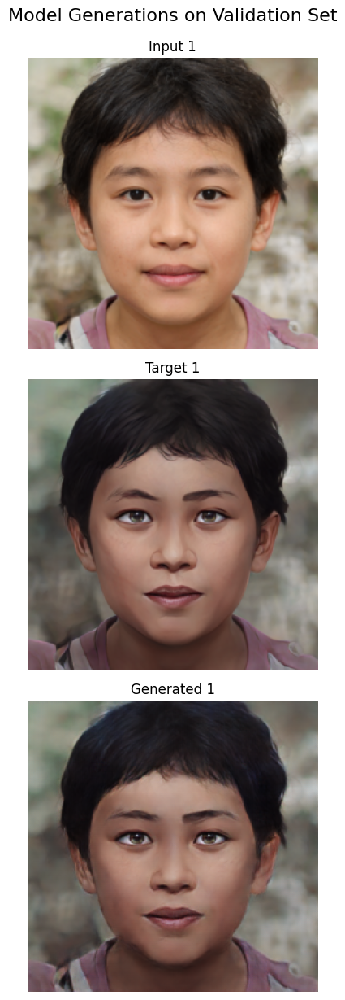

Validation complete.


In [12]:
# 9. 验证模型：生成示例图像

print("\nGenerating example images on validation set...")

# 加载你希望用来验证的模型，可以加载 'best_gen_model.pth' 或 'final_gen_model.pth'
# 如果你中断过训练，并且没有保存 best_gen_model.pth，这里也可以加载最新的 checkpoint
# 例如，加载最终模型:
#model_to_load = os.path.join(CHECKPOINT_DIR, "final_gen_model.pth")
# 或者加载最佳模型 (如果存在):
model_to_load = os.path.join(CHECKPOINT_DIR, "best_gen_model.pth")

if os.path.exists(model_to_load):
    print(f"Loading generator model from: {model_to_load}")
    gen.load_state_dict(torch.load(model_to_load, map_location=DEVICE))
else:
    print(f"Warning: Model not found at {model_to_load}. Using current generator state. Ensure you saved a model.")

# 将生成器设置为评估模式
gen.eval()

# 从验证加载器中获取一批图像进行可视化
num_display_images = min(val_loader.batch_size, 4) # 显示的图片数量，最多为 batch_size 或 4

try:
    val_iter = iter(val_loader)
    images, targets = next(val_iter) # 获取一个批次的数据
    images, targets = images.to(DEVICE), targets.to(DEVICE)

    with torch.no_grad(): # 在评估模式下，不需要计算梯度
        converted_images = gen(images) # 生成风格化图像

    # 将 Tensor 转换回 NumPy 数组，并调整通道顺序以便 Matplotlib 显示 (CxHxW -> HxWxC)
    # 将像素值从 [-1, 1] 转换回 [0, 1] 以便正确显示
    display_inputs = (images[:num_display_images].cpu().numpy().transpose(0, 2, 3, 1) * 0.5 + 0.5).clip(0, 1)
    display_targets = (targets[:num_display_images].cpu().numpy().transpose(0, 2, 3, 1) * 0.5 + 0.5).clip(0, 1)
    display_generations = (converted_images[:num_display_images].cpu().numpy().transpose(0, 2, 3, 1) * 0.5 + 0.5).clip(0, 1)


    plt.figure(figsize=(num_display_images * 4, 12)) # 调整图表大小以适应更多图片

    for i in range(num_display_images):
        # 原始输入图像
        plt.subplot(3, num_display_images, i + 1)
        plt.imshow(display_inputs[i])
        plt.title(f"Input {i+1}")
        plt.axis("off")

        # 真实目标图像
        plt.subplot(3, num_display_images, i + 1 + num_display_images)
        plt.imshow(display_targets[i])
        plt.title(f"Target {i+1}")
        plt.axis("off")

        # 生成的风格化图像
        plt.subplot(3, num_display_images, (i + 1) + 2 * num_display_images)
        plt.imshow(display_generations[i])
        plt.title(f"Generated {i+1}")
        plt.axis("off")

    plt.tight_layout() # 调整子图布局，避免重叠
    plt.suptitle("Model Generations on Validation Set", fontsize=16, y=1.02) # 添加总标题
    plt.show()

except StopIteration:
    print("Validation loader is empty. Cannot display results.")
except Exception as e:
    print(f"An error occurred during visualization: {e}")

print("Validation complete.")


Testing single image generation...
Loaded generator for inference from: checkpoints\best_gen_model.pth
Generating for image: E:\计算机视觉\09-图像风格迁移-上课\FFHQ dataset\test_A\400.png


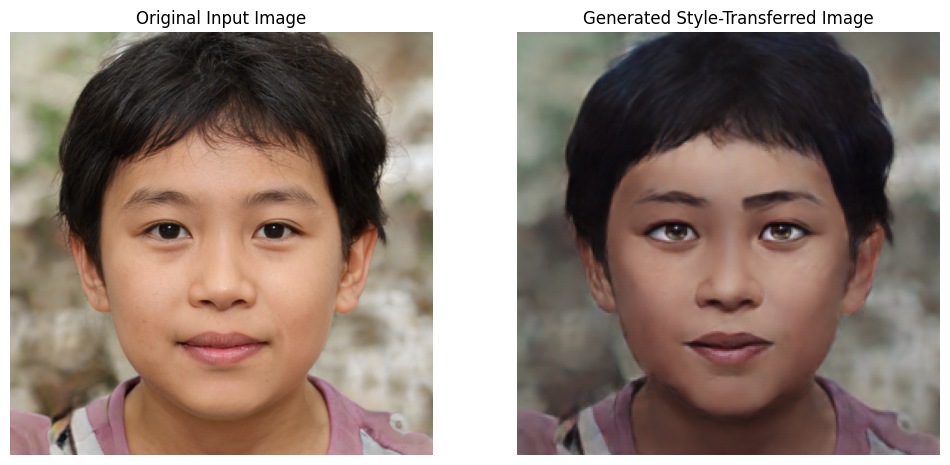

Single image generation test complete.


In [13]:
# 10. 单张图片生成功能

def generate_single_image(image_path, model, transform, device):
    """
    使用训练好的模型对单张图片进行风格生成。
    Args:
        image_path (str): 输入图片的路径。
        model (nn.Module): 训练好的生成器模型。
        transform (transforms.Compose): 图像预处理 transforms。
        device (torch.device): 运行设备 (CPU/GPU)。
    Returns:
        numpy.ndarray: 生成的图像 (HxWxC, 0-1 范围)。
    """
    try:
        # 加载图片
        img = Image.open(image_path).convert("RGB")
    except FileNotFoundError:
        print(f"Error: Image not found at {image_path}")
        return None
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

    # 预处理图片并添加到批次维度
    input_tensor = transform(img).unsqueeze(0).to(device)

    # 将模型设置为评估模式
    model.eval()

    with torch.no_grad(): # 不计算梯度
        generated_tensor = model(input_tensor)

    # 将生成结果转换回 NumPy 数组，并调整通道顺序以便 Matplotlib 显示 (CxHxW -> HxWxC)
    # 将像素值从 [-1, 1] 转换回 [0, 1]
    generated_img_np = (generated_tensor[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)

    return generated_img_np

# --- 运行示例 ---
print("\nTesting single image generation...")

# 确保加载了最终或最佳模型用于此功能
# model_path_for_inference = os.path.join(CHECKPOINT_DIR, "final_gen_model.pth")
model_path_for_inference = os.path.join(CHECKPOINT_DIR, "best_gen_model.pth") # 优先使用最佳模型

if os.path.exists(model_path_for_inference):
    gen_inference = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)
    gen_inference.load_state_dict(torch.load(model_path_for_inference, map_location=DEVICE))
    print(f"Loaded generator for inference from: {model_path_for_inference}")

    # 选择一张图片进行测试。可以从 test_A 文件夹中选择一张，也可以是你自己的新图片。
    # 为了演示，我们从 test_A 中选择第一张图片
    if len(val_dataset) > 0:
        # 获取测试集中第一张原始图片的路徑
        sample_inference_image_path = val_dataset.images_path[0]
        sample_original_image = Image.open(sample_inference_image_path).convert("RGB") # 用于显示原始图

        print(f"Generating for image: {sample_inference_image_path}")
        generated_image = generate_single_image(sample_inference_image_path, gen_inference, transform, DEVICE)

        if generated_image is not None:
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(sample_original_image)
            plt.title("Original Input Image")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(generated_image)
            plt.title("Generated Style-Transferred Image")
            plt.axis('off')
            plt.show()
    else:
        print("Validation dataset is empty, cannot pick a sample image for single image generation.")
        print("Please manually specify `my_custom_image_path = 'path/to/your/image.png'` and uncomment the lines below to test with your own image.")
        # my_custom_image_path = 'path/to/your/image.png' # <--- 修改为你的图片路径
        # if os.path.exists(my_custom_image_path):
        #     sample_original_image = Image.open(my_custom_image_path).convert("RGB")
        #     generated_image = generate_single_image(my_custom_image_path, gen_inference, transform, DEVICE)
        #     if generated_image is not None:
        #         plt.figure(figsize=(12, 6))
        #         plt.subplot(1, 2, 1)
        #         plt.imshow(sample_original_image)
        #         plt.title("Original Input Image")
        #         plt.axis('off')

        #         plt.subplot(1, 2, 2)
        #         plt.imshow(generated_image)
        #         plt.title("Generated Style-Transferred Image")
        #         plt.axis('off')
        #         plt.show()
        # else:
        #     print(f"Custom image not found at {my_custom_image_path}")

else:
    print(f"Error: Model not found at {model_path_for_inference}. Please train the model first.")

print("Single image generation test complete.")


Generating example images on validation set...
Loading generator model from: checkpoints\best_gen_model.pth
Only displaying 1 samples.


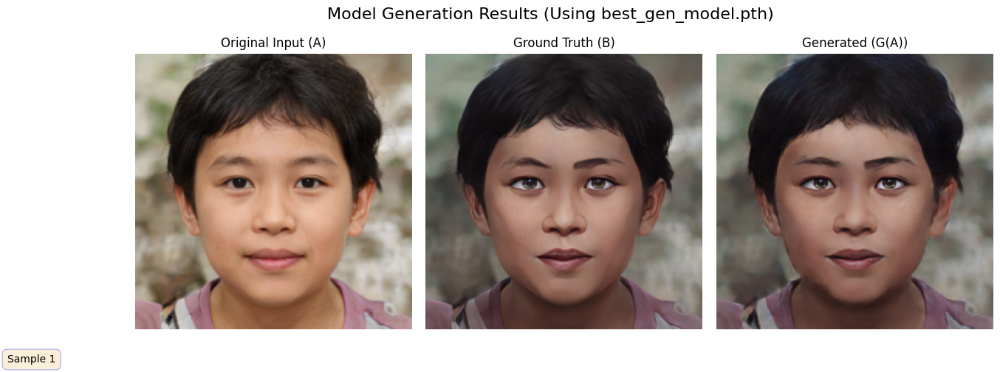

Validation complete.


In [ ]:
# 9. Validate Model: Generate Example Images

print("\nGenerating example images on validation set...")

# --- User-defined display parameters ---
# Set the number of samples you wish to display.
# IMPORTANT: Ensure your val_loader's batch_size is AT LEAST this value
# for all samples to be fetched in one go.
CUSTOM_DISPLAY_SAMPLES = 5 # Example: set to 5

# Load the desired generator model for validation
model_to_load = os.path.join(CHECKPOINT_DIR, "best_gen_model.pth") # Prioritize loading the best model

if os.path.exists(model_to_load):
    print(f"Loading generator model from: {model_to_load}")
    # 'gen' variable is assumed to be defined globally or in a preceding cell.
    gen.load_state_dict(torch.load(model_to_load, map_location=DEVICE))
else:
    print(f"Warning: Model not found at {model_to_load}. Using current generator state. Ensure you saved a model.")
    print("Please make sure 'best_gen_model.pth' exists in your CHECKPOINT_DIR.")
    # Fallback to final_gen_model.pth if best is not found (optional)
    # final_model_path = os.path.join(CHECKPOINT_DIR, "final_gen_model.pth")
    # if os.path.exists(final_model_path):
    #     print(f"Attempting to load final generator model from: {final_model_path}")
    #     gen.load_state_dict(torch.load(final_model_path, map_location=DEVICE))
    # else:
    #     print("Neither best_gen_model.pth nor final_gen_model.pth found. Using current generator state.")

# Set the generator to evaluation mode
gen.eval()

# Attempt to get a batch of images from the validation loader for visualization
# 'val_loader' variable is assumed to be defined globally or in a preceding cell.
try:
    val_iter = iter(val_loader)
    images_batch, targets_batch = next(val_iter) # Get one batch of data
    images_batch, targets_batch = images_batch.to(DEVICE), targets_batch.to(DEVICE)

    # Determine the actual number of images to display
    # It's the minimum of user's request and the actual batch size
    num_actual_display = min(CUSTOM_DISPLAY_SAMPLES, images_batch.shape[0])

    if num_actual_display < CUSTOM_DISPLAY_SAMPLES:
        print(f"Warning: val_loader batch size ({images_batch.shape[0]}) is less than CUSTOM_DISPLAY_SAMPLES ({CUSTOM_DISPLAY_SAMPLES}).")
        print(f"Only displaying {num_actual_display} samples.")

    with torch.no_grad(): # No need to calculate gradients in evaluation mode
        converted_images_batch = gen(images_batch) # Generate stylized images

    # Convert Tensors to NumPy arrays and adjust channel order for Matplotlib (CxHxW -> HxWxC)
    # Denormalize pixel values from [-1, 1] back to [0, 1] for correct display
    display_inputs = (images_batch[:num_actual_display].cpu().numpy().transpose(0, 2, 3, 1) * 0.5 + 0.5).clip(0, 1)
    display_targets = (targets_batch[:num_actual_display].cpu().numpy().transpose(0, 2, 3, 1) * 0.5 + 0.5).clip(0, 1)
    display_generations = (converted_images_batch[:num_actual_display].cpu().numpy().transpose(0, 2, 3, 1) * 0.5 + 0.5).clip(0, 1)

    # --- Matplotlib Side-by-Side Display and Numerical Information ---
    # Each row contains 3 images: Original Input, Ground Truth, Generated Result
    # Leave space at the bottom for additional information text
    # figsize width: 3 images * approx. image width, height: (approx. image height + text info height) * num_samples
    fig, axes = plt.subplots(num_actual_display, 3, 
                             figsize=(15, 4 * num_actual_display + 1), # +1 for extra height for bottom info
                             gridspec_kw={'wspace':0.05, 'hspace':0.05}) # Adjust subplot spacing

    # If only one sample is displayed, axes will be a 1D array. Reshape to 2D for consistent looping.
    if num_actual_display == 1:
        axes = np.expand_dims(axes, axis=0)
    
    info_texts = [] # List to store text information for display at the bottom

    for i in range(num_actual_display):
        # Sample information (e.g., index of the sample)
        # If your DataLoader provides filenames, you can replace this.
        # Example if val_loader returned (images, targets, filenames):
        # sample_info = f"Sample {i+1}: {filenames[i]}"
        sample_info = f"Sample {i+1}" 
        info_texts.append(sample_info)

        # Original Input Image
        ax_input = axes[i][0]
        ax_input.imshow(display_inputs[i])
        if i == 0: ax_input.set_title("Original Input (A)", fontsize=12) # Changed to English
        ax_input.axis("off")

        # Ground Truth Image
        ax_target = axes[i][1]
        ax_target.imshow(display_targets[i])
        if i == 0: ax_target.set_title("Ground Truth (B)", fontsize=12) # Changed to English
        ax_target.axis("off")

        # Generated Stylized Image
        ax_gen = axes[i][2]
        ax_gen.imshow(display_generations[i])
        if i == 0: ax_gen.set_title("Generated (G(A))", fontsize=12) # Changed to English
        ax_gen.axis("off")

    # Add a large text area at the bottom of the figure to display extra information for all samples
    # Adjust the entire figure size to make space for the bottom info
    plt.subplots_adjust(bottom=0.08) # Reserve bottom space for text information
    
    # Use plt.figtext to add text at the bottom of the figure
    # xy=(0.01, 0.01) are figure coordinates, starting from bottom-left
    plt.figtext(0.01, 0.01, "\n".join(info_texts), 
                fontsize=10, 
                verticalalignment='bottom', 
                horizontalalignment='left',
                bbox=dict(boxstyle="round,pad=0.5", fc="wheat", ec="b", lw=0.5, alpha=0.5))

    plt.suptitle(f"Model Generation Results (Using {os.path.basename(model_to_load)})", fontsize=16, y=0.98) # Main title, changed to English
    plt.show()

except StopIteration:
    print("Validation loader is empty. Cannot display results. Please check if val_loader has data.")
except Exception as e:
    print(f"An error occurred during visualization: {e}")
    # This might print specific error messages if the val_loader setup is incorrect
    # or if there's an issue with image data itself.

print("Validation complete.")


Generating example images from specified paths...
Loading generator model from: checkpoints\best_gen_model.pth

Displaying 5 selected test samples...


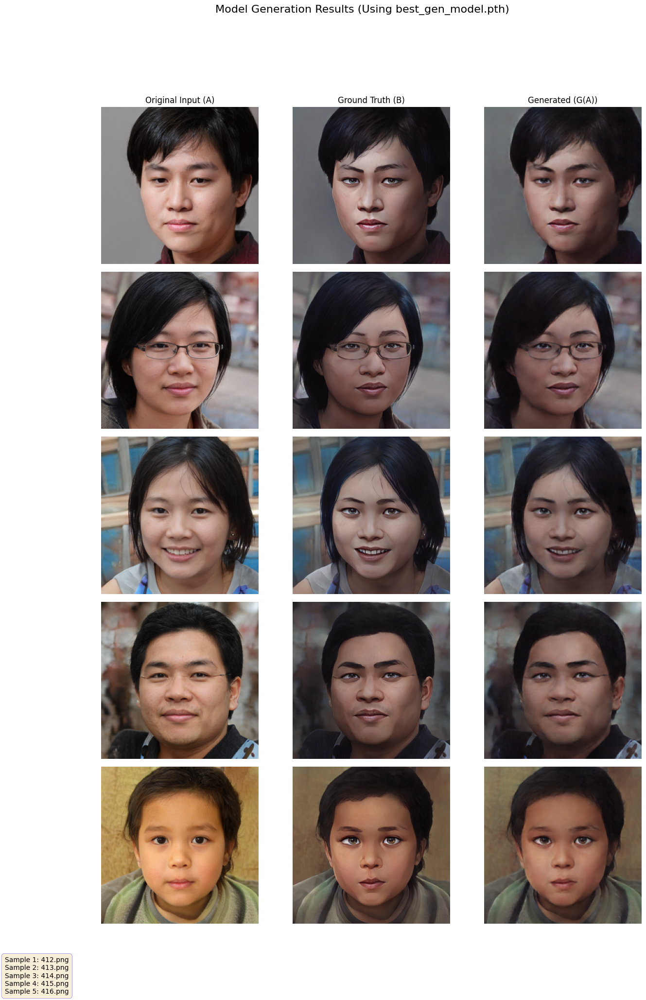

Image generation and display complete.


In [ ]:
# 9. Validate Model: Generate Example Images

print("\nGenerating example images from specified paths...")

# --- 配置部分 (请根据你的实际情况修改这些参数和路径) ---

# 确保这些参数与你训练模型时使用的参数一致
IMAGE_SIZE = 256 # 图像尺寸，例如 256x256
CHECKPOINT_DIR = "checkpoints" # 模型保存的目录
# !!! 请将 'E:\计算机视觉\09-图像风格迁移-上课\FFHQ dataset' 替换为你的数据集根目录的实际路径 !!!
# 例如: DATA_ROOT = r"D:\MyProject\FFHQ dataset" (Windows)
# 或: DATA_ROOT = "/home/user/data/FFHQ dataset" (Linux/macOS)
DATA_ROOT = r"E:\计算机视觉\09-图像风格迁移-上课\FFHQ dataset" 

# 你的最佳生成器模型保存路径
BEST_GENERATOR_MODEL_PATH = os.path.join(CHECKPOINT_DIR, "best_gen_model.pth")

# --- 定义你想要展示的图片的具体路径 ---
# 请在这里直接列出你希望展示的 test_A 域图片的完整路径
# 确保这些图片存在于你的文件系统中
SELECTED_INPUT_IMAGE_PATHS = [
    os.path.join(DATA_ROOT, r"test_A\412.png"),
    os.path.join(DATA_ROOT, r"test_A\413.png"),
    os.path.join(DATA_ROOT, r"test_A\414.png"),
    os.path.join(DATA_ROOT, r"test_A\415.png"), # 示例：添加更多图片
    os.path.join(DATA_ROOT, r"test_A\416.png"),
    # 你可以继续添加更多图片的路径
]

# 自动确定要展示的样本数量
NUM_DISPLAY_SAMPLES = len(SELECTED_INPUT_IMAGE_PATHS)

# --- 模型加载 (假设 'gen' 实例和 'DEVICE' 已在 Notebook 前面的 Cell 中定义) ---
if os.path.exists(BEST_GENERATOR_MODEL_PATH):
    print(f"Loading generator model from: {BEST_GENERATOR_MODEL_PATH}")
    gen.load_state_dict(torch.load(BEST_GENERATOR_MODEL_PATH, map_location=DEVICE))
else:
    print(f"Error: Best generator model not found at {BEST_GENERATOR_MODEL_PATH}. Exiting.")
    print("Please ensure 'best_gen_model.pth' exists in your CHECKPOINT_DIR.")
    exit()

# 将生成器设置为评估模式
gen.eval()

# --- 图像预处理与后处理转换 (假设 'transform' 已在 Notebook 前面的 Cell 中定义) ---
# 再次提醒：这里的 transform 必须与你训练时使用的数据加载转换一致
# transform = transforms.Compose([
#     transforms.Resize(IMAGE_SIZE), 
#     transforms.ToTensor(),         
#     transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]), 
# ])


# --- 辅助函数：加载、生成并准备用于展示的图像 ---
def load_generate_and_prepare_images_from_path(input_img_path, generator_model, transform_pipeline, device):
    """
    根据给定的 input_img_path，自动构建 ground_truth_img_path，
    加载图片，通过生成器生成图像，并将所有图像转换为 NumPy 数组 (HWC, 0-1 范围) 
    以便 matplotlib 显示。
    """
    # 从 input_img_path 构建对应的 ground_truth_img_path
    # 假设 test_A 和 test_B 文件夹结构相同，且文件名一致
    filename = os.path.basename(input_img_path)
    # 将 "test_A" 替换为 "test_B" 来构建真实图像路径
    ground_truth_img_path = input_img_path.replace(r"test_A", r"test_B") # 适用于Windows路径
    # 如果是Linux/macOS路径，可能是 input_img_path.replace("/test_A/", "/test_B/")
    # 更好的做法是基于 DATA_ROOT 和文件名重建路径
    ground_truth_img_path = os.path.join(DATA_ROOT, "test_B", filename)


    try:
        input_image_pil = Image.open(input_img_path).convert("RGB")
        ground_truth_image_pil = Image.open(ground_truth_img_path).convert("RGB")
    except FileNotFoundError as e:
        print(f"Error: File not found - {e.filename}. Skipping this sample.")
        return None, None, None, None
    except Exception as e:
        print(f"Error loading image files {input_img_path} or {ground_truth_img_path}: {e}. Skipping this sample.")
        return None, None, None, None

    input_tensor = transform_pipeline(input_image_pil).unsqueeze(0).to(device)

    generator_model.eval()

    with torch.no_grad():
        generated_tensor = generator_model(input_tensor)

    # Image post-processing for Matplotlib display
    input_image_np = np.array(input_image_pil.resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)).astype(np.float32) / 255.0
    ground_truth_image_np = np.array(ground_truth_image_pil.resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)).astype(np.float32) / 255.0
    generated_image_np = (generated_tensor[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)

    return input_image_np, ground_truth_image_np, generated_image_np, filename

# --- 主程序执行部分 ---

print(f"\nDisplaying {NUM_DISPLAY_SAMPLES} selected test samples...")

# Set up Matplotlib subplots
# Each row will have 3 columns (Original Input, Ground Truth, Generated)
# Adjust figsize based on the number of samples and space for text info
fig, axes = plt.subplots(NUM_DISPLAY_SAMPLES, 3, 
                         figsize=(15, 4 * NUM_DISPLAY_SAMPLES + 1), # +1 for extra height for bottom info
                         gridspec_kw={'wspace':0.05, 'hspace':0.05}) # Adjust subplot spacing

# If only one sample is displayed, axes will be a 1D array. Reshape to 2D for consistent looping.
if NUM_DISPLAY_SAMPLES == 1:
    axes = np.expand_dims(axes, axis=0)

info_texts = [] # List to store text information for display at the bottom

for i, input_filepath in enumerate(SELECTED_INPUT_IMAGE_PATHS):
    original_img_np, ground_truth_img_np, generated_img_np, image_name = \
        load_generate_and_prepare_images_from_path(input_filepath, gen, transform, DEVICE)

    if original_img_np is not None:
        # Original Input Image
        ax_input = axes[i][0]
        ax_input.imshow(original_img_np)
        if i == 0: ax_input.set_title("Original Input (A)", fontsize=12)
        ax_input.axis("off")

        # Ground Truth Image
        ax_target = axes[i][1]
        ax_target.imshow(ground_truth_img_np)
        if i == 0: ax_target.set_title("Ground Truth (B)", fontsize=12)
        ax_target.axis("off")

        # Generated Stylized Image
        ax_gen = axes[i][2]
        ax_gen.imshow(generated_img_np)
        if i == 0: ax_gen.set_title("Generated (G(A))", fontsize=12)
        ax_gen.axis("off")

        # Collect information for bottom display
        info_texts.append(f"Sample {i+1}: {image_name}")
    else:
        # If image loading failed, hide axes for this row
        for j in range(3):
            axes[i][j].axis('off')
        info_texts.append(f"Sample {i+1}: Error, failed to load or generate image from {os.path.basename(input_filepath)}.")

# Add a large text area at the bottom of the figure to display extra information for all samples
plt.subplots_adjust(bottom=0.08) # Reserve bottom space for text information

plt.figtext(0.01, 0.01, "\n".join(info_texts), 
            fontsize=10, 
            verticalalignment='bottom', 
            horizontalalignment='left',
            bbox=dict(boxstyle="round,pad=0.5", fc="wheat", ec="b", lw=0.5, alpha=0.5))

plt.suptitle(f"Model Generation Results (Using {os.path.basename(BEST_GENERATOR_MODEL_PATH)})", fontsize=16, y=0.98)
plt.show()

print("Image generation and display complete.")

Using device: cpu
Auxiliary network modules defined.
Generator (U-Net) defined.
Loading Model 1 from: E:\计算机视觉\fgqy\FOURTH\best_gen_model_130.pth
Loading Model 2 from: E:\计算机视觉\fgqy\FOURTH\best_gen_model_160.pth
Loading Model 3 from: E:\计算机视觉\fgqy\checkpoints_v4\best_gen_model.pth

Displaying 5 selected test samples for model comparison...


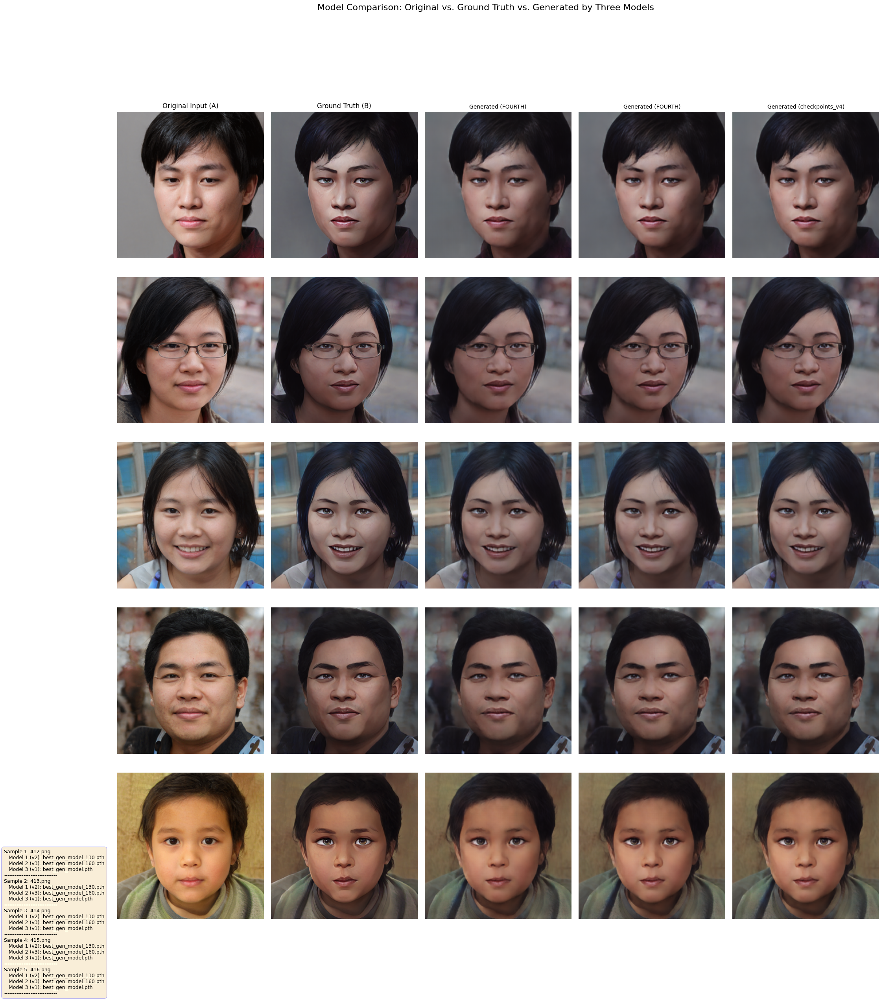

Model comparison display complete.


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# --- 2. 设备配置 (请确保 DEVICE 和 transform 在其他地方已定义) ---
# 建议在您的 Notebook 开始时定义这些，例如：
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

# 图像预处理转换（确保与训练时一致）
# 如果你已经有了 transform 变量的定义，可以删除或注释掉下面这行
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

# --- 3. 构建网络：辅助模块 ---

# 定义一个便捷的卷积块
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding,
                 use_bn=True, dropout=False, leaky_relu=True):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=not use_bn)
        self.bn = nn.BatchNorm2d(out_channels) if use_bn else None
        self.activation = nn.LeakyReLU(0.2, inplace=True) if leaky_relu else nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5) if dropout else None

    def forward(self, x):
        x = self.conv(x)
        if self.bn is not None:
            x = self.bn(x)
        x = self.activation(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

# U-Net 生成器中的编码器块 (Downsampling)
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(EncoderBlock, self).__init__()
        self.conv_block = ConvBlock(in_channels, out_channels, kernel_size=4, stride=2, padding=1, use_bn=True, dropout=dropout, leaky_relu=True)

    def forward(self, x):
        return self.conv_block(x)

# U-Net 生成器中的解码器块 (Upsampling)
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(DecoderBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5) if dropout else None

    def forward(self, x):
        x = self.deconv(x)
        x = self.bn(x)
        x = self.relu(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

print("Auxiliary network modules defined.")

# --- 4. 生成器（Generator）---
class Generator(torch.nn.Module):
    def __init__(self, in_channels=3, out_channels=3, features=64):
        super(Generator, self).__init__()
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.down1 = EncoderBlock(features, features * 2)
        self.down2 = EncoderBlock(features * 2, features * 4)
        self.down3 = EncoderBlock(features * 4, features * 8)
        self.down4 = EncoderBlock(features * 8, features * 8)
        self.down5 = EncoderBlock(features * 8, features * 8)
        self.down6 = EncoderBlock(features * 8, features * 8)

        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.ReLU(inplace=True),
        )

        self.up1 = DecoderBlock(features * 8, features * 8, dropout=True)
        self.up2 = DecoderBlock(features * 8 * 2, features * 8, dropout=True)
        self.up3 = DecoderBlock(features * 8 * 2, features * 8, dropout=True)
        self.up4 = DecoderBlock(features * 8 * 2, features * 8)
        self.up5 = DecoderBlock(features * 8 * 2, features * 4)
        self.up6 = DecoderBlock(features * 4 * 2, features * 2)
        self.up7 = DecoderBlock(features * 2 * 2, features)

        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        d1 = self.initial_down(x)
        d2 = self.down1(d1)
        d3 = self.down2(d2)
        d4 = self.down3(d3)
        d5 = self.down4(d4)
        d6 = self.down5(d5)
        d7 = self.down6(d6)

        bottleneck = self.bottleneck(d7)

        up1 = self.up1(bottleneck)
        up2 = self.up2(torch.cat([up1, d7], 1))
        up3 = self.up3(torch.cat([up2, d6], 1))
        up4 = self.up4(torch.cat([up3, d5], 1))
        up5 = self.up5(torch.cat([up4, d4], 1))
        up6 = self.up6(torch.cat([up5, d3], 1))
        up7 = self.up7(torch.cat([up6, d2], 1))

        output = self.final_up(torch.cat([up7, d1], 1))
        return output

print("Generator (U-Net) defined.")

# --- 9. 模型对比和图像生成 ---

# --- Configuration Section (Please modify these parameters and paths) ---

# Ensure these parameters match those used during model training
IMAGE_SIZE = 256 # Image size, e.g., 256x256

# !!! IMPORTANT: Replace with your actual dataset root path !!!
DATA_ROOT = r"E:\计算机视觉\09-图像风格迁移-上课\FFHQ dataset"


# --- End of Configuration Section ---

# Load the pre-trained model

# --- Define the paths to the three models for comparison ---
# 将你的三个路径分配给三个模型变量
MODEL1_PATH = r"E:\计算机视觉\fgqy\FOURTH\best_gen_model_130.pth" # 你的第一个模型 (v2)
MODEL2_PATH = r"E:\计算机视觉\fgqy\FOURTH\best_gen_model_160.pth" # 你的第二个模型 (v3)
MODEL3_PATH = r"E:\计算机视觉\fgqy\checkpoints_v4\best_gen_model.pth" # 你的第三个模型 (v1)

# --- Define the specific image paths you want to compare ---
SELECTED_INPUT_IMAGE_PATHS = [
    os.path.join(DATA_ROOT, r"test_A\412.png"), 
    os.path.join(DATA_ROOT, r"test_A\413.png"),
    os.path.join(DATA_ROOT, r"test_A\414.png"),
    os.path.join(DATA_ROOT, r"test_A\415.png"),
    os.path.join(DATA_ROOT, r"test_A\416.png"),
    # Add more image paths as needed for comparison
]

# Automatically determine the number of samples to display based on the list length
NUM_DISPLAY_SAMPLES = len(SELECTED_INPUT_IMAGE_PATHS)

# --- Model Loading ---
# Create three instances of the Generator model for comparison
gen_model1 = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)
gen_model2 = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)
gen_model3 = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE) # <-- 新增：第三个模型实例

# Load state_dict for Model 1
if os.path.exists(MODEL1_PATH):
    print(f"Loading Model 1 from: {MODEL1_PATH}")
    gen_model1.load_state_dict(torch.load(MODEL1_PATH, map_location=DEVICE))
else:
    print(f"Error: Model 1 not found at {MODEL1_PATH}. Cannot perform comparison. Exiting.")
    exit()

# Load state_dict for Model 2
if os.path.exists(MODEL2_PATH):
    print(f"Loading Model 2 from: {MODEL2_PATH}")
    gen_model2.load_state_dict(torch.load(MODEL2_PATH, map_location=DEVICE))
else:
    print(f"Error: Model 2 not found at {MODEL2_PATH}. Cannot perform comparison. Exiting.")
    exit()

# Load state_dict for Model 3 # <-- 新增：加载第三个模型
if os.path.exists(MODEL3_PATH):
    print(f"Loading Model 3 from: {MODEL3_PATH}")
    gen_model3.load_state_dict(torch.load(MODEL3_PATH, map_location=DEVICE))
else:
    print(f"Error: Model 3 not found at {MODEL3_PATH}. Cannot perform comparison. Exiting.")
    exit()

# Set all generators to evaluation mode
gen_model1.eval()
gen_model2.eval()
gen_model3.eval() # <-- 新增：设置第三个模型为评估模式

# --- Helper function: Load, Generate, and Prepare Images for Display ---
# 修改函数签名，接受第三个模型
def process_single_sample_for_comparison(input_img_path, model1, model2, model3, transform_pipeline, device, data_root_path):
    """
    Loads an input image and its ground truth, generates images from three models,
    and converts all to NumPy arrays (HWC, 0-1 range) for Matplotlib display.
    """
    filename = os.path.basename(input_img_path)
    ground_truth_img_path = os.path.join(data_root_path, "test_B", filename)

    try:
        input_image_pil = Image.open(input_img_path).convert("RGB")
        ground_truth_image_pil = Image.open(ground_truth_img_path).convert("RGB")
    except FileNotFoundError as e:
        print(f"Error: File not found - {e.filename}. Skipping this sample.")
        return None, None, None, None, None, None # 返回值增加一个 None
    except Exception as e:
        print(f"Error loading image files {input_img_path} or {ground_truth_img_path}: {e}. Skipping this sample.")
        return None, None, None, None, None, None # 返回值增加一个 None

    input_tensor = transform_pipeline(input_image_pil).unsqueeze(0).to(device)

    with torch.no_grad(): # Disable gradient calculation for inference
        generated_tensor1 = model1(input_tensor)
        generated_tensor2 = model2(input_tensor)
        generated_tensor3 = model3(input_tensor) # <-- 新增：第三个模型的生成结果

    # Convert Tensors to NumPy arrays and denormalize for Matplotlib display
    input_image_np = np.array(input_image_pil.resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)).astype(np.float32) / 255.0
    ground_truth_image_np = np.array(ground_truth_image_pil.resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)).astype(np.float32) / 255.0
    generated_image_np1 = (generated_tensor1[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)
    generated_image_np2 = (generated_tensor2[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)
    generated_image_np3 = (generated_tensor3[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1) # <-- 新增：第三个模型的 NumPy 图像

    return input_image_np, ground_truth_image_np, generated_image_np1, generated_image_np2, generated_image_np3, filename # <-- 返回值增加 generated_image_np3

# --- Main Program Execution ---

print(f"\nDisplaying {NUM_DISPLAY_SAMPLES} selected test samples for model comparison...")

# Set up Matplotlib subplots for 5 columns per row (Original, GT, Model1, Model2, Model3)
# 调整 figsize 宽度以适应 5 列
fig, axes = plt.subplots(NUM_DISPLAY_SAMPLES, 5, # <-- 列数从 4 变为 5
                         figsize=(25, 5 * NUM_DISPLAY_SAMPLES + 1), # Adjusted size for 5 columns
                         gridspec_kw={'wspace':0.05, 'hspace':0.05})

# If only one sample is to be displayed, axes might be a 1D array. Reshape to 2D for consistent looping.
if NUM_DISPLAY_SAMPLES == 1:
    axes = np.expand_dims(axes, axis=0)

info_texts = [] # List to store text information to display at the bottom

for i, input_filepath in enumerate(SELECTED_INPUT_IMAGE_PATHS):
    # 调用函数时，传递第三个模型，并接收第三个模型的生成图像
    original_img_np, ground_truth_img_np, generated_img_np1, generated_img_np2, generated_img_np3, image_name = \
        process_single_sample_for_comparison(input_filepath, gen_model1, gen_model2, gen_model3, transform, DEVICE, DATA_ROOT)

    if original_img_np is not None:
        # Original Input Image (Column 0)
        ax_input = axes[i][0]
        ax_input.imshow(original_img_np)
        if i == 0: ax_input.set_title("Original Input (A)", fontsize=12)
        ax_input.axis("off")

        # Ground Truth Image (Column 1)
        ax_target = axes[i][1]
        ax_target.imshow(ground_truth_img_np)
        if i == 0: ax_target.set_title("Ground Truth (B)", fontsize=12)
        ax_target.axis("off")

        # Generated from Model 1 (Column 2)
        ax_gen1 = axes[i][2]
        ax_gen1.imshow(generated_img_np1)
        # 标题显示模型文件名 (只保留文件名部分，更简洁)
        if i == 0: ax_gen1.set_title(f"Generated ({os.path.basename(os.path.dirname(MODEL1_PATH))})", fontsize=10)
        ax_gen1.axis("off")

        # Generated from Model 2 (Column 3)
        ax_gen2 = axes[i][3]
        ax_gen2.imshow(generated_img_np2)
        if i == 0: ax_gen2.set_title(f"Generated ({os.path.basename(os.path.dirname(MODEL2_PATH))})", fontsize=10)
        ax_gen2.axis("off")

        # Generated from Model 3 (Column 4) # <-- 新增：第三个模型的绘图
        ax_gen3 = axes[i][4]
        ax_gen3.imshow(generated_img_np3)
        if i == 0: ax_gen3.set_title(f"Generated ({os.path.basename(os.path.dirname(MODEL3_PATH))})", fontsize=10)
        ax_gen3.axis("off")

        # Collect information for bottom display for this sample
        info_texts.append(f"Sample {i+1}: {image_name}")
        info_texts.append(f"   Model 1 (v2): {os.path.basename(MODEL1_PATH)}")
        info_texts.append(f"   Model 2 (v3): {os.path.basename(MODEL2_PATH)}")
        info_texts.append(f"   Model 3 (v1): {os.path.basename(MODEL3_PATH)}") # <-- 新增：第三个模型的信息
        info_texts.append("-" * 30)
    else:
        for j in range(5): # <-- 列数从 4 变为 5
            axes[i][j].axis('off')
        info_texts.append(f"Sample {i+1}: Error processing image from {os.path.basename(input_filepath)}.")
        info_texts.append("-" * 30)

# Add a large text area at the bottom of the figure to display all collected information
plt.subplots_adjust(bottom=0.08)

final_info_string = "\n".join(info_texts)

plt.figtext(0.01, 0.01, final_info_string,
            fontsize=9,
            verticalalignment='bottom',
            horizontalalignment='left',
            bbox=dict(boxstyle="round,pad=0.5", fc="wheat", ec="b", lw=0.5, alpha=0.5))

plt.suptitle("Model Comparison: Original vs. Ground Truth vs. Generated by Three Models", fontsize=16, y=0.98) # <-- 更新主标题
plt.show()

print("Model comparison display complete.")

Using device: cpu
Auxiliary network modules defined.
Generator (U-Net) defined with dimension matching for skip connections.
Loading Model 1 from: E:\计算机视觉\fgqy\FOURTH\best_gen_model_130.pth
Loading Model 2 from: E:\计算机视觉\fgqy\FOURTH\best_gen_model_160.pth
Loading Model 3 from: E:\计算机视觉\fgqy\checkpoints_v4\best_gen_model.pth

Displaying 1 selected test samples for model comparison...


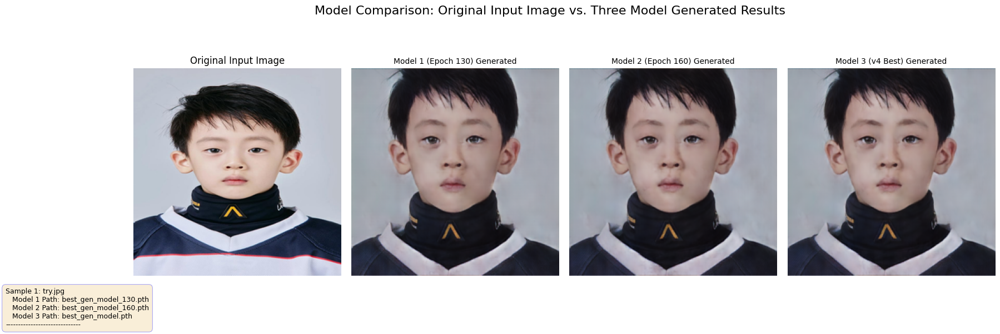

Model comparison display complete.


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# --- 2. Device Configuration ---
# Automatically detect and use GPU (CUDA) if available, otherwise use CPU
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

# Image preprocessing transformations (ensure these match what was used during model training)
transform = transforms.Compose([
    transforms.Resize(256),  # Resize the image to 256x256
    transforms.ToTensor(),   # Convert image to PyTorch tensor
    # Normalize to [-1, 1] range, which is typically the output range of GAN generator models
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

# --- 3. Network Construction: Auxiliary Modules ---

# Define a convenient convolutional block
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding,
                 use_bn=True, dropout=False, leaky_relu=True):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=not use_bn)
        self.bn = nn.BatchNorm2d(out_channels) if use_bn else None
        # Select activation function based on leaky_relu parameter
        self.activation = nn.LeakyReLU(0.2, inplace=True) if leaky_relu else nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5) if dropout else None

    def forward(self, x):
        x = self.conv(x)
        if self.bn is not None:
            x = self.bn(x)
        x = self.activation(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

# Encoder block in U-Net Generator (downsampling part)
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(EncoderBlock, self).__init__()
        self.conv_block = ConvBlock(in_channels, out_channels, kernel_size=4, stride=2, padding=1, use_bn=True, dropout=dropout, leaky_relu=True)

    def forward(self, x):
        return self.conv_block(x)

# Decoder block in U-Net Generator (upsampling part)
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=False):
        super(DecoderBlock, self).__init__()
        # ConvTranspose2d for upsampling
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5) if dropout else None

    def forward(self, x):
        x = self.deconv(x)
        x = self.bn(x)
        x = self.relu(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

print("Auxiliary network modules defined.")

# --- 4. Generator ---
# This is a U-Net architecture Generator
class Generator(torch.nn.Module):
    def __init__(self, in_channels=3, out_channels=3, features=64):
        super(Generator, self).__init__()
        # Initial downsampling layer
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # Encoder (downsampling) blocks
        self.down1 = EncoderBlock(features, features * 2)
        self.down2 = EncoderBlock(features * 2, features * 4)
        self.down3 = EncoderBlock(features * 4, features * 8)
        self.down4 = EncoderBlock(features * 8, features * 8)
        self.down5 = EncoderBlock(features * 8, features * 8)
        self.down6 = EncoderBlock(features * 8, features * 8)

        # Bottleneck layer
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.ReLU(inplace=True),
        )

        # Decoder (upsampling) blocks, with skip connections concatenation
        # Dropout in some decoder blocks for regularization
        self.up1 = DecoderBlock(features * 8, features * 8, dropout=True)
        self.up2 = DecoderBlock(features * 8 * 2, features * 8, dropout=True) # Multiplied by 2 due to skip connection
        self.up3 = DecoderBlock(features * 8 * 2, features * 8, dropout=True)
        self.up4 = DecoderBlock(features * 8 * 2, features * 8)
        self.up5 = DecoderBlock(features * 8 * 2, features * 4)
        self.up6 = DecoderBlock(features * 4 * 2, features * 2)
        self.up7 = DecoderBlock(features * 2 * 2, features)

        # Final upsampling layer
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(), # Tanh activation function normalizes output to [-1, 1]
        )

    # Helper function: Match spatial dimensions of tensors
    def _match_spatial_dims(self, tensor_to_adjust, target_tensor):
        target_h, target_w = target_tensor.shape[2:]
        current_h, current_w = tensor_to_adjust.shape[2:]

        if current_h == target_h and current_w == target_w:
            return tensor_to_adjust
        
        # If the current tensor is larger than the target (e.g., 17x17 -> 16x16), perform central cropping
        if current_h > target_h or current_w > target_w:
            start_h = (current_h - target_h) // 2
            end_h = start_h + target_h
            start_w = (current_w - target_w) // 2
            end_w = start_w + target_w
            return tensor_to_adjust[:, :, start_h:end_h, start_w:end_w]
        
        # If the current tensor is smaller than the target (less common for skip connections from encoder to decoder),
        # an interpolation fallback is provided. Cropping is usually preferred for U-Nets.
        print(f"Warning: Unexpected dimension mismatch. Adjusting {current_h}x{current_w} to {target_h}x{target_w} using interpolation as a fallback.")
        return torch.nn.functional.interpolate(tensor_to_adjust, size=(target_h, target_w), mode='bilinear', align_corners=False)


    def forward(self, x):
        # Encoder path
        d1 = self.initial_down(x) # Expected 128x128
        d2 = self.down1(d1)      # Expected 64x64
        d3 = self.down2(d2)      # Expected 32x32
        d4 = self.down3(d3)      # Expected 16x16
        d5 = self.down4(d4)      # Expected 8x8
        d6 = self.down5(d5)      # Expected 4x4
        d7 = self.down6(d6)      # Expected 2x2

        # Bottleneck layer
        bottleneck = self.bottleneck(d7) # Expected 1x1

        # Decoder path (with skip connections)
        # Use _match_spatial_dims helper function to ensure dimensions match before concatenation
        up1 = self.up1(bottleneck) # Expected 2x2
        d7_matched = self._match_spatial_dims(d7, up1)
        up2 = self.up2(torch.cat([up1, d7_matched], 1)) # Expected 4x4

        d6_matched = self._match_spatial_dims(d6, up2)
        up3 = self.up3(torch.cat([up2, d6_matched], 1)) # Expected 8x8

        d5_matched = self._match_spatial_dims(d5, up3)
        up4 = self.up4(torch.cat([up3, d5_matched], 1)) # Expected 16x16

        # This is the previously problematic line where d4 might be 17x17 and up4 16x16.
        # Now, d4_matched will have the correct dimensions after adjustment.
        d4_matched = self._match_spatial_dims(d4, up4)
        up5 = self.up5(torch.cat([up4, d4_matched], 1)) # Expected 32x32

        d3_matched = self._match_spatial_dims(d3, up5)
        up6 = self.up6(torch.cat([up5, d3_matched], 1)) # Expected 64x64

        d2_matched = self._match_spatial_dims(d2, up6)
        up7 = self.up7(torch.cat([up6, d2_matched], 1)) # Expected 128x128

        d1_matched = self._match_spatial_dims(d1, up7)
        output = self.final_up(torch.cat([up7, d1_matched], 1)) # Expected 256x256
        return output

print("Generator (U-Net) defined with dimension matching for skip connections.")

# --- 9. Model Comparison and Image Generation ---

# --- Configuration (Please modify with your actual paths and parameters) ---

# Ensure these parameters match those used during model training
IMAGE_SIZE = 256 # Image size, e.g., 256x256

# --- Model Path Definitions ---
# Assign your three model paths to the variables below
MODEL1_PATH = r"E:\计算机视觉\fgqy\FOURTH\best_gen_model_130.pth" # Your first model (v2)
MODEL2_PATH = r"E:\计算机视觉\fgqy\FOURTH\best_gen_model_160.pth" # Your second model (v3)
MODEL3_PATH = r"E:\计算机视觉\fgqy\checkpoints_v4\best_gen_model.pth" # Your third model (v1)

# --- Define the specific input image path you want to compare ---
SELECTED_INPUT_IMAGE_PATHS = [
    r"E:\计算机视觉\09-图像风格迁移-上课\try.jpg",
]

# Automatically determine the number of samples to display
NUM_DISPLAY_SAMPLES = len(SELECTED_INPUT_IMAGE_PATHS)

# --- Model Loading ---
# Create three Generator model instances for comparison
gen_model1 = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)
gen_model2 = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)
gen_model3 = Generator(in_channels=3, out_channels=3, features=64).to(DEVICE)

# Load state dict for Model 1
if os.path.exists(MODEL1_PATH):
    print(f"Loading Model 1 from: {MODEL1_PATH}")
    try:
        gen_model1.load_state_dict(torch.load(MODEL1_PATH, map_location=DEVICE))
    except RuntimeError as e:
        print(f"Error loading Model 1: {e}. Please check if the file is corrupted or incomplete. Cannot proceed with comparison.")
        exit() # Exit if a critical model cannot be loaded
else:
    print(f"Error: Model 1 not found at {MODEL1_PATH}. Cannot proceed with comparison.")
    exit()

# Load state dict for Model 2
if os.path.exists(MODEL2_PATH):
    print(f"Loading Model 2 from: {MODEL2_PATH}")
    try:
        gen_model2.load_state_dict(torch.load(MODEL2_PATH, map_location=DEVICE))
    except RuntimeError as e:
        print(f"Error loading Model 2: {e}. Please check if the file is corrupted or incomplete. Cannot proceed with comparison.")
        exit()
else:
    print(f"Error: Model 2 not found at {MODEL2_PATH}. Cannot proceed with comparison.")
    exit()

# Load state dict for Model 3
if os.path.exists(MODEL3_PATH):
    print(f"Loading Model 3 from: {MODEL3_PATH}")
    try:
        gen_model3.load_state_dict(torch.load(MODEL3_PATH, map_location=DEVICE))
    except RuntimeError as e:
        print(f"Error loading Model 3: {e}. Please check if the file is corrupted or incomplete. Cannot proceed with comparison.")
        exit()
else:
    print(f"Error: Model 3 not found at {MODEL3_PATH}. Cannot proceed with comparison.")
    exit()

# Set all generators to evaluation mode (disable dropout and BatchNorm updates)
gen_model1.eval()
gen_model2.eval()
gen_model3.eval()

# --- Helper function: Load, generate, and prepare images for display (modified for single custom input image) ---
def process_single_custom_image_for_comparison(input_img_path, model1, model2, model3, transform_pipeline, device):
    """
    Loads a single input image, generates images from three models, and converts all images
    to NumPy arrays (HWC, 0-1 range) for Matplotlib display.
    This function does not require a ground truth target image.
    """
    filename = os.path.basename(input_img_path)

    try:
        input_image_pil = Image.open(input_img_path).convert("RGB")
    except FileNotFoundError:
        print(f"Error: Input image not found at {input_img_path}. Skipping this sample.")
        return None, None, None, None, None
    except Exception as e:
        print(f"Error loading input image {input_img_path}: {e}. Skipping this sample.")
        return None, None, None, None, None

    # Preprocess the input image and send to device
    input_tensor = transform_pipeline(input_image_pil).unsqueeze(0).to(device)

    with torch.no_grad(): # Disable gradient calculation during inference
        generated_tensor1 = model1(input_tensor)
        generated_tensor2 = model2(input_tensor)
        generated_tensor3 = model3(input_tensor)

    # Convert tensors to NumPy arrays and denormalize for Matplotlib display
    # When converting PIL image to NumPy, resize to target size and normalize to 0-1 first
    input_image_np = np.array(input_image_pil.resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)).astype(np.float32) / 255.0
    # Generated images are in [-1, 1] range, convert to [0, 1] range
    generated_image_np1 = (generated_tensor1[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)
    generated_image_np2 = (generated_tensor2[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)
    generated_image_np3 = (generated_tensor3[0].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5).clip(0, 1)

    return input_image_np, generated_image_np1, generated_image_np2, generated_image_np3, filename

# --- Main Program Execution ---

print(f"\nDisplaying {NUM_DISPLAY_SAMPLES} selected test samples for model comparison...")

# Set up Matplotlib subplots, 4 columns per row (Original, Model 1, Model 2, Model 3)
fig, axes = plt.subplots(NUM_DISPLAY_SAMPLES, 4,
                         figsize=(20, 5 * NUM_DISPLAY_SAMPLES + 1),
                         gridspec_kw={'wspace':0.05, 'hspace':0.05})

# If only one sample is displayed, axes might be a 1D array. Reshape to 2D for consistent looping.
if NUM_DISPLAY_SAMPLES == 1:
    axes = np.expand_dims(axes, axis=0)

info_texts = [] # Stores text information to display at the bottom

for i, input_filepath in enumerate(SELECTED_INPUT_IMAGE_PATHS):
    # Call the modified helper function
    original_img_np, generated_img_np1, generated_img_np2, generated_img_np3, image_name = \
        process_single_custom_image_for_comparison(input_filepath, gen_model1, gen_model2, gen_model3, transform, DEVICE)

    if original_img_np is not None:
        # Original Input Image (Column 0)
        ax_input = axes[i][0]
        ax_input.imshow(original_img_np)
        if i == 0: ax_input.set_title("Original Input Image", fontsize=12)
        ax_input.axis("off")

        # Model 1 Generated Image (Column 1)
        ax_gen1 = axes[i][1]
        ax_gen1.imshow(generated_img_np1)
        if i == 0: ax_gen1.set_title(f"Model 1 (Epoch 130) Generated", fontsize=10)
        ax_gen1.axis("off")

        # Model 2 Generated Image (Column 2)
        ax_gen2 = axes[i][2]
        ax_gen2.imshow(generated_img_np2)
        if i == 0: ax_gen2.set_title(f"Model 2 (Epoch 160) Generated", fontsize=10)
        ax_gen2.axis("off")

        # Model 3 Generated Image (Column 3)
        ax_gen3 = axes[i][3]
        ax_gen3.imshow(generated_img_np3)
        if i == 0: ax_gen3.set_title(f"Model 3 (v4 Best) Generated", fontsize=10)
        ax_gen3.axis("off")

        # Collect information for this sample to display at the bottom
        info_texts.append(f"Sample {i+1}: {image_name}")
        info_texts.append(f"   Model 1 Path: {os.path.basename(MODEL1_PATH)}")
        info_texts.append(f"   Model 2 Path: {os.path.basename(MODEL2_PATH)}")
        info_texts.append(f"   Model 3 Path: {os.path.basename(MODEL3_PATH)}")
        info_texts.append("-" * 30)
    else:
        for j in range(4):
            axes[i][j].axis('off')
        info_texts.append(f"Sample {i+1}: Error processing image from {os.path.basename(input_filepath)}.")
        info_texts.append("-" * 30)

# Add a large text area at the bottom of the plot to display all collected information
plt.subplots_adjust(bottom=0.08)

final_info_string = "\n".join(info_texts)

plt.figtext(0.01, 0.01, final_info_string,
            fontsize=9,
            verticalalignment='bottom',
            horizontalalignment='left',
            bbox=dict(boxstyle="round,pad=0.5", fc="wheat", ec="b", lw=0.5, alpha=0.5))

plt.suptitle("Model Comparison: Original Input Image vs. Three Model Generated Results", fontsize=16, y=0.98)
plt.show()

print("Model comparison display complete.")